# Group 1
* 2602052613 - Jovian Yanto 
* 2602068605 - Fernaldy Ferdinand 
* 2602058112 - Jessica Liviana Widiatmo
* 2602066934 - Jocelyn

### Loading basic Libraries

In [1]:
import os
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import warnings
from sklearn.metrics import accuracy_score, f1_score
warnings.filterwarnings('ignore')

2024-06-20 17:56:00.600766: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-20 17:56:00.600998: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-20 17:56:00.727416: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Checking Data if there anomaly

In [2]:
path = '/kaggle/input/motif-batik'

In [3]:
directory = '/kaggle/input/motif-batik/batik-betawi' #change gfor each class

# Iterate through the files in the directory
for filename in os.listdir(directory):
    # Join the directory path with the filename
    filepath = os.path.join(directory, filename)
    
    # Check if the file is a valid image file
    try:
        with Image.open(filepath) as img:
            # If the image format is not one of the supported formats, convert it
            if img.format not in ['JPEG', 'PNG', 'GIF', 'BMP']:
                print(f"Converting {filename} to PNG...")
                img.save(filepath, 'PNG')  # Convert to PNG format
    except Exception as e:
        print(f"Error processing {filename}: {e}")
        os.remove(filepath)
        print(f"{filename} removed from {class_name}")

In [4]:
os.listdir(path)

['batik-keraton', 'batik-kawung', 'batik-betawi']

# Loading Dataset

In [5]:
classes = [
    'batik-keraton',
    'batik-kawung',
    'batik-betawi']

In [6]:
data = tf.keras.utils.image_dataset_from_directory(
    path, 
    class_names=classes,
    image_size=(224, 224))

data_iterator = data.as_numpy_iterator()

Found 145 files belonging to 3 classes.


In [7]:
# rerun for next batch
batch = data_iterator.next()

In [8]:
batch[1]

array([0, 2, 1, 0, 0, 1, 0, 0, 1, 0, 0, 2, 1, 0, 0, 2, 2, 2, 2, 0, 1, 1,
       2, 0, 2, 1, 2, 2, 1, 2, 1, 1], dtype=int32)

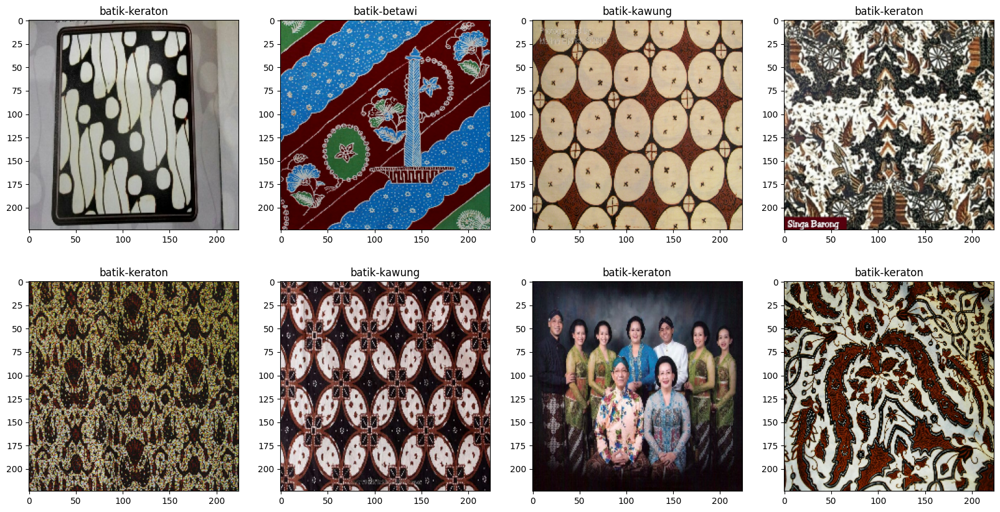

In [9]:
fig ,ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
for row in range(2):
    for col in range(4):
        idx = row * 4 + col
        ax[row, col].imshow(batch[0][idx].astype(int))
        class_idx = batch[1][idx]  # Get the class index
        class_name = classes[class_idx]  # Map the class index to the class name
        ax[row, col].title.set_text(class_name) 

## Data Preprocessing - Scaling

In [10]:
batch[0].max()

255.0

In [11]:
len(batch[0])

32

In [12]:
scaled = batch[0] / 255

scaled_data = data.map(lambda x,y : (x/255, y))

data_iterator = scaled_data.as_numpy_iterator()
batch = data_iterator.next()

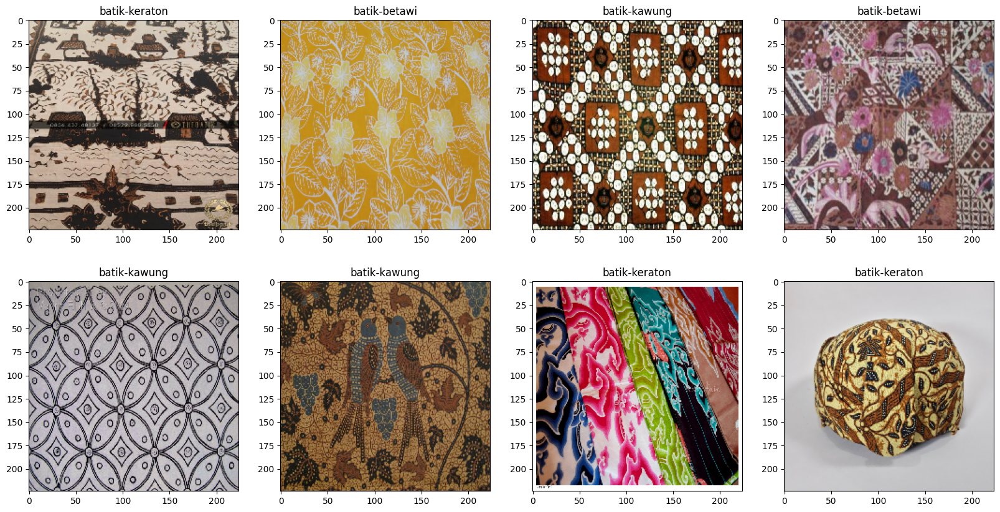

In [13]:
fig ,ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
for row in range(2):
    for col in range(4):
        idx = row * 4 + col
        ax[row, col].imshow(batch[0][idx]) # remove astype int
        class_idx = batch[1][idx]  
        class_name = classes[class_idx] 
        ax[row, col].title.set_text(class_name)

In [14]:
len(scaled_data)

5

# Data Splitting

In [15]:
randomized_data = scaled_data.shuffle(buffer_size=len(scaled_data), seed=42)

train_size = int(len(scaled_data)*.6)
test_size = int(len(scaled_data)*.2)
val_size = int(len(scaled_data)*.2)

train = randomized_data.take(train_size)
val = randomized_data.skip(train_size).take(val_size)
test = randomized_data.skip(train_size+val_size).take(test_size)

In [16]:
print(len(train))
print(len(test))
print(len(val))

3
1
1


## Using Pretrained Model Params < 10M

In [17]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

#MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(4096, activation='relu'))
model.add(Dense(4096, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Freeze the base model
base_model.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ ?                      │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

# Training Model

In [18]:
from tensorflow.keras.callbacks import EarlyStopping

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True)
hist = model.fit(train, epochs=100, validation_data=val, callbacks=[early_stopping])

Epoch 1/100
1/3 ━━━━━━━━━━━━━━━━━━━━ 32s 16s/step - accuracy: 0.4062 - loss: 1.1441

I0000 00:00:1718906203.171539      80 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1718906203.205695      80 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2/3 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - accuracy: 0.4378 - loss: 1.6276  

W0000 00:00:1718906214.442077      81 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 6s/step - accuracy: 0.4411 - loss: 3.4061 - val_accuracy: 0.4062 - val_loss: 4.9950
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 532ms/step - accuracy: 0.5063 - loss: 3.7756 - val_accuracy: 0.5938 - val_loss: 1.7235
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 595ms/step - accuracy: 0.7231 - loss: 1.1121 - val_accuracy: 0.7188 - val_loss: 0.4701
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 464ms/step - accuracy: 0.7747 - loss: 0.3891 - val_accuracy: 0.9375 - val_loss: 0.1573
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 361ms/step - accuracy: 0.8424 - loss: 0.3023 - val_accuracy: 0.9375 - val_loss: 0.1622
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.9427 - loss: 0.1539 - val_accuracy: 1.0000 - val_loss: 0.0783
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 377ms/step - accuracy: 0.9740 - loss: 0.0983 - val_accuracy: 0.9375 - val_loss: 0.0949
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 457ms/step - accuracy: 0.9570 - loss: 0.0828 - val_accuracy: 1.0000 - val_loss: 0.0135
E

# Model Performance Overtime

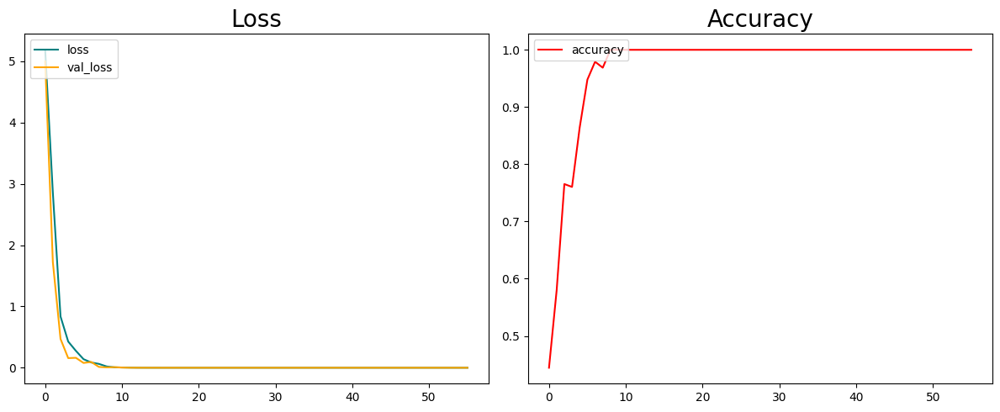

In [19]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].plot(hist.history['loss'], color='teal', label='loss')
axs[0].plot(hist.history['val_loss'], color='orange', label='val_loss')
axs[0].set_title('Loss', fontsize=20)
axs[0].legend(loc='upper left')


axs[1].plot(hist.history['accuracy'], color='red', label='accuracy')
axs[1].set_title('Accuracy', fontsize=20)
axs[1].legend(loc='upper left')

plt.tight_layout()
plt.show()

In [20]:
# function for displaying predicted and original image
def display_images(images, true_labels, predicted_labels, num_images=10):
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        ax = plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(images[i])
        plt.title(f"True: {true_labels[i]}, Pred: {predicted_labels[i]}")
        plt.axis("off")

# Validation Data Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


W0000 00:00:1718906309.287084      78 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Test Accuracy: 1.0
F1 Score: 1.0


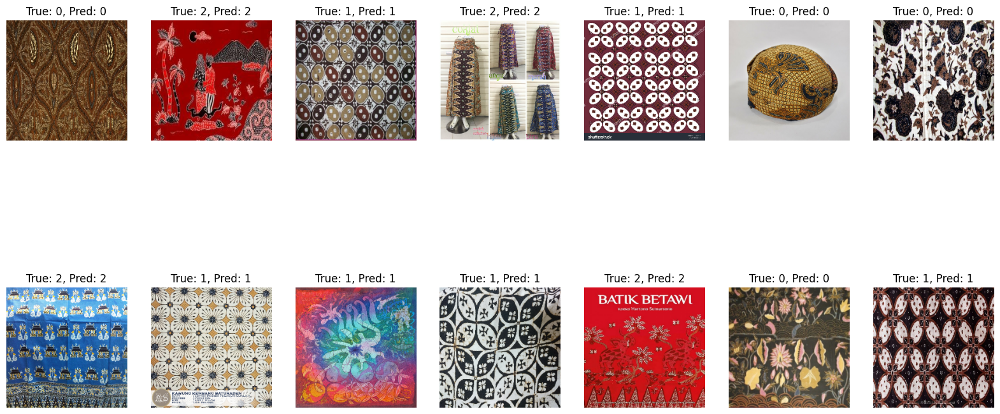

In [21]:
val_images = []
val_labels = []
for image_batch, label_batch in val:
    val_images.append(image_batch.numpy())
    val_labels.append(label_batch.numpy())

val_images = np.concatenate(val_images)
val_labels = np.concatenate(val_labels)

# Predict probabilities for each class
y_pred_probs = model.predict(val_images)

# Get predicted labels
y_pred_val = np.argmax(y_pred_probs, axis=1)

# Calculate accuracy
accuracy = accuracy_score(val_labels, y_pred_val)

# Calculate F1 score
f1 = f1_score(val_labels, y_pred_val, average='macro') 

print("Test Accuracy:", accuracy)
print("F1 Score:", f1)
display_images(val_images, val_labels, y_pred_val, num_images=14)

# Test Data Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Test Accuracy: 1.0
F1 Score: 1.0


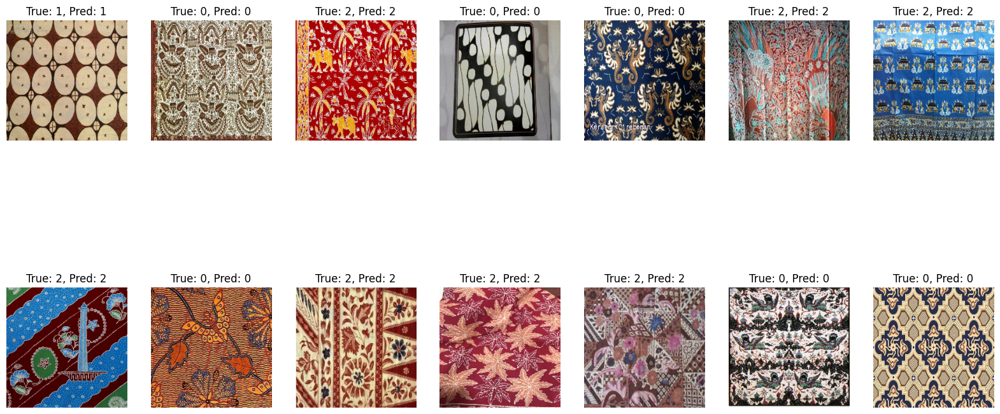

In [22]:
test_images = []
test_labels = []
for image_batch, label_batch in test:
    test_images.append(image_batch.numpy())
    test_labels.append(label_batch.numpy())

test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Predict probabilities for each class
y_pred_probs = model.predict(test_images)

# Get predicted labels
y_pred_test = np.argmax(y_pred_probs, axis=1)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred_test)

# Calculate F1 score
f1 = f1_score(test_labels, y_pred_test, average='macro') 

print("Test Accuracy:", accuracy)
print("F1 Score:", f1)
display_images(test_images, test_labels, y_pred_test, num_images=14)

## Data Training Scratch using tuned ResNet50 architecture for with small total parameters for efficiency

In [23]:
import keras
from keras.layers import Input, Conv2D, BatchNormalization, Activation, Add, Flatten, Dense, MaxPooling2D, GlobalAveragePooling2D
from keras.models import Model
from keras.optimizers import SGD

# Residual block
def residual_block(x, filters, kernel_size=3, stride=1, conv_shortcut=True):
    """
    A residual block.
    
    Arguments:
    x -- input tensor
    filters -- number of filters
    kernel_size -- kernel size of the convolutional layer
    stride -- stride of the first layer
    conv_shortcut -- whether to use a convolutional shortcut
    
    Returns:
    x -- output tensor for the block
    """
    shortcut = x

    if conv_shortcut:
        shortcut = Conv2D(filters, 1, strides=stride)(x)
        shortcut = BatchNormalization()(shortcut)
    
    x = Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)
    
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    
    return x

# Building the ResNet-50 architecture
def build_resnet(input_shape=(224, 224, 3), num_classes=3):
    inputs = Input(shape=input_shape)
    
    # Initial layers
    x = Conv2D(64, 7, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(3, strides=2, padding='same')(x)
    
    # Stage 1
    x = residual_block(x, 32, conv_shortcut=True)
    x = residual_block(x, 32, conv_shortcut=False)
    x = residual_block(x, 32, conv_shortcut=False)

    # Stage 2
    x = residual_block(x, 64, stride=2, conv_shortcut=True)
    x = residual_block(x, 64, conv_shortcut=False)
    x = residual_block(x, 64, conv_shortcut=False)
    x = residual_block(x, 64, conv_shortcut=False)

    # Stage 3
    x = residual_block(x, 128, stride=2, conv_shortcut=True)
    x = residual_block(x, 128, conv_shortcut=False)
    x = residual_block(x, 128, conv_shortcut=False)
    x = residual_block(x, 128, conv_shortcut=False)
    x = residual_block(x, 128, conv_shortcut=False)
    x = residual_block(x, 128, conv_shortcut=False)

    # Stage 4
    x = residual_block(x, 256, stride=2, conv_shortcut=True)
    x = residual_block(x, 256, conv_shortcut=False)
    x = residual_block(x, 256, conv_shortcut=False)

    
    # Final layers
    x = GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)
    
    # Create model
    model = Model(inputs, x)
    
    return model

# Build and compile the ResNet-50 model
model = build_resnet(input_shape=(224, 224, 3), num_classes=3)
model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │      9,472 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 56, 56,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 56, 56,    │     18,464 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 56, 56,    │      9,248 │ activation_1[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 56, 56,    │      2,080 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 56, 56,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 56, 56,    │          0 │ add[0][0]         │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 56, 56,    │      9,248 │ activation_2[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 56, 56,    │          0 │ batch_normalizat

 Total params: 5,357,603 (20.44 MB)

 Trainable params: 5,348,963 (20.40 MB)

 Non-trainable params: 8,640 (33.75 KB)

# Model Training

In [24]:
from tensorflow.keras.callbacks import EarlyStopping

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True) # set patience to 80 to get maximum epoch
hist = model.fit(train, epochs=100, validation_data=val, callbacks=[early_stopping])

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 53s 10s/step - accuracy: 0.3610 - loss: 1.3713 - val_accuracy: 0.2500 - val_loss: 1.4156
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 431ms/step - accuracy: 0.2989 - loss: 1.5083 - val_accuracy: 0.3125 - val_loss: 4.3648
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 421ms/step - accuracy: 0.4167 - loss: 1.2492 - val_accuracy: 0.3438 - val_loss: 18.3076
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 422ms/step - accuracy: 0.5286 - loss: 1.1932 - val_accuracy: 0.2188 - val_loss: 23.4665
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 700ms/step - accuracy: 0.5689 - loss: 0.9188 - val_accuracy: 0.3438 - val_loss: 16.2769
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 429ms/step - accuracy: 0.5820 - loss: 0.9147 - val_accuracy: 0.3750 - val_loss: 29.1266
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 425ms/step - accuracy: 0.6328 - loss: 1.1088 - val_accuracy: 0.2188 - val_loss: 56.0655
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 393ms/step - accuracy: 0.5070 - loss: 1.0356 - val_accuracy: 0.3438

# Model Performance Overtime

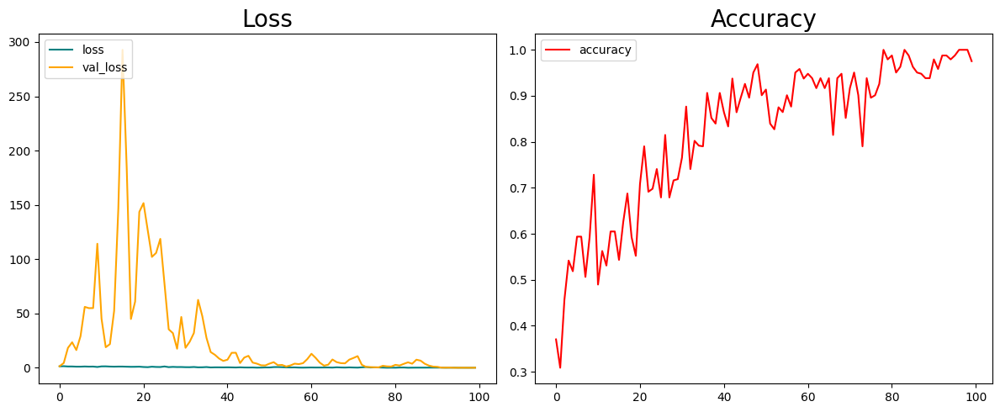

In [25]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].plot(hist.history['loss'], color='teal', label='loss')
axs[0].plot(hist.history['val_loss'], color='orange', label='val_loss')
axs[0].set_title('Loss', fontsize=20)
axs[0].legend(loc='upper left')


axs[1].plot(hist.history['accuracy'], color='red', label='accuracy')
axs[1].set_title('Accuracy', fontsize=20)
axs[1].legend(loc='upper left')

plt.tight_layout()
plt.show()

# Validation Data Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Test Accuracy: 1.0
F1 Score: 1.0


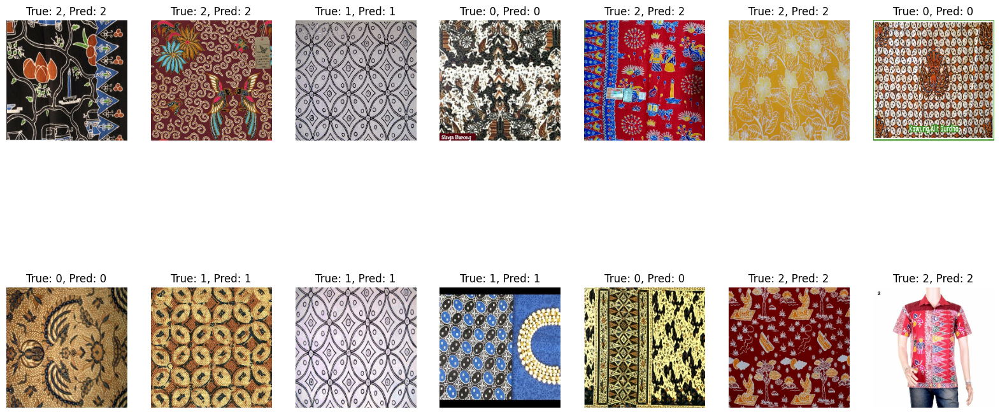

In [26]:
val_images = []
val_labels = []
for image_batch, label_batch in val:
    val_images.append(image_batch.numpy())
    val_labels.append(label_batch.numpy())

val_images = np.concatenate(val_images)
val_labels = np.concatenate(val_labels)

# Predict probabilities for each class
y_pred_probs = model.predict(val_images)

# Get predicted labels
y_pred_val = np.argmax(y_pred_probs, axis=1)

# Calculate accuracy
accuracy = accuracy_score(val_labels, y_pred_val)

# Calculate F1 score
f1 = f1_score(val_labels, y_pred_val, average='macro')  # Change average as per your requirement

print("Test Accuracy:", accuracy)
print("F1 Score:", f1)
display_images(val_images, val_labels, y_pred_val, num_images=14)

# Test Data Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Test Accuracy: 1.0
F1 Score: 1.0


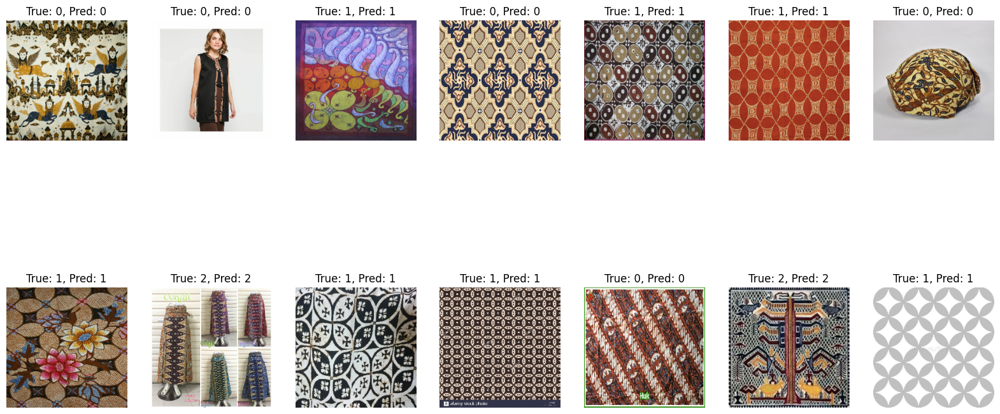

In [27]:
test_images = []
test_labels = []
for image_batch, label_batch in test:
    test_images.append(image_batch.numpy())
    test_labels.append(label_batch.numpy())

test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Predict probabilities for each class
y_pred_probs = model.predict(test_images)

# Get predicted labels
y_pred_test = np.argmax(y_pred_probs, axis=1)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred_test)

# Calculate F1 score
f1 = f1_score(test_labels, y_pred_test, average='macro') 

print("Test Accuracy:", accuracy)
print("F1 Score:", f1)
display_images(test_images, test_labels, y_pred_test, num_images=14)